In [1]:
from __future__ import division, print_function

In [2]:
import numpy as np
import matplotlib.pyplot as plt

import h5py
from ktransit import FitTransit, LCModel


%matplotlib inline

In [3]:
fn = '../mcmc/koi1_np4_priorTrue_dil0_circTrue.hdf5'
f = h5py.File(fn)

fn1 = '../mcmc/koi1_np4_priorTrue_dil0_circFalse.hdf5'
f1 = h5py.File(fn1)

In [4]:
g = f['mcmc']['chain']
g1 = f1['mcmc']['chain']

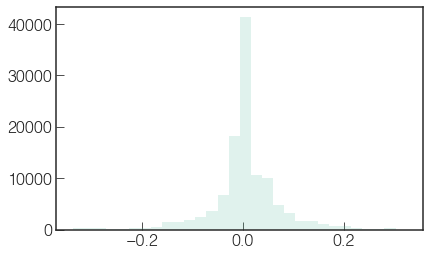

In [5]:
x = 15
# q = plt.hist(g[:,-550:,x].flatten(),bins=30,alpha=0.2)
q = plt.hist(g1[:,-550:,x].flatten(),bins=30,alpha=0.2)

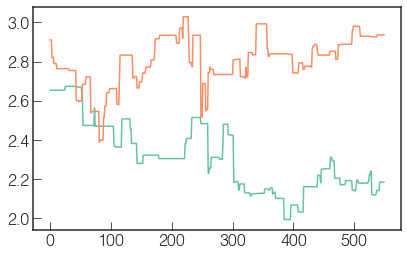

In [6]:
plt.plot(g1[0,-550:,0])
plt.plot(g1[150,-550:,0])

In [39]:
import corner
gg = np.reshape(g1[:,-550::100,:], [-1,29])

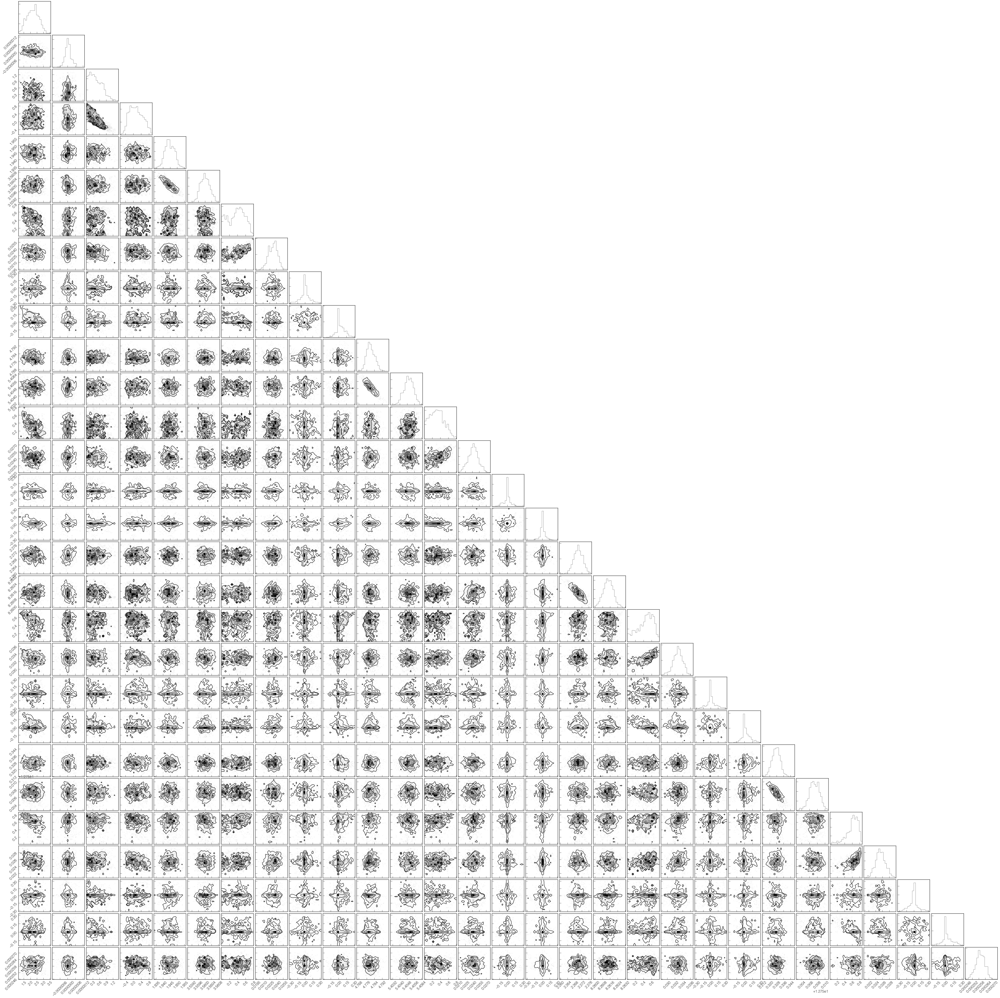

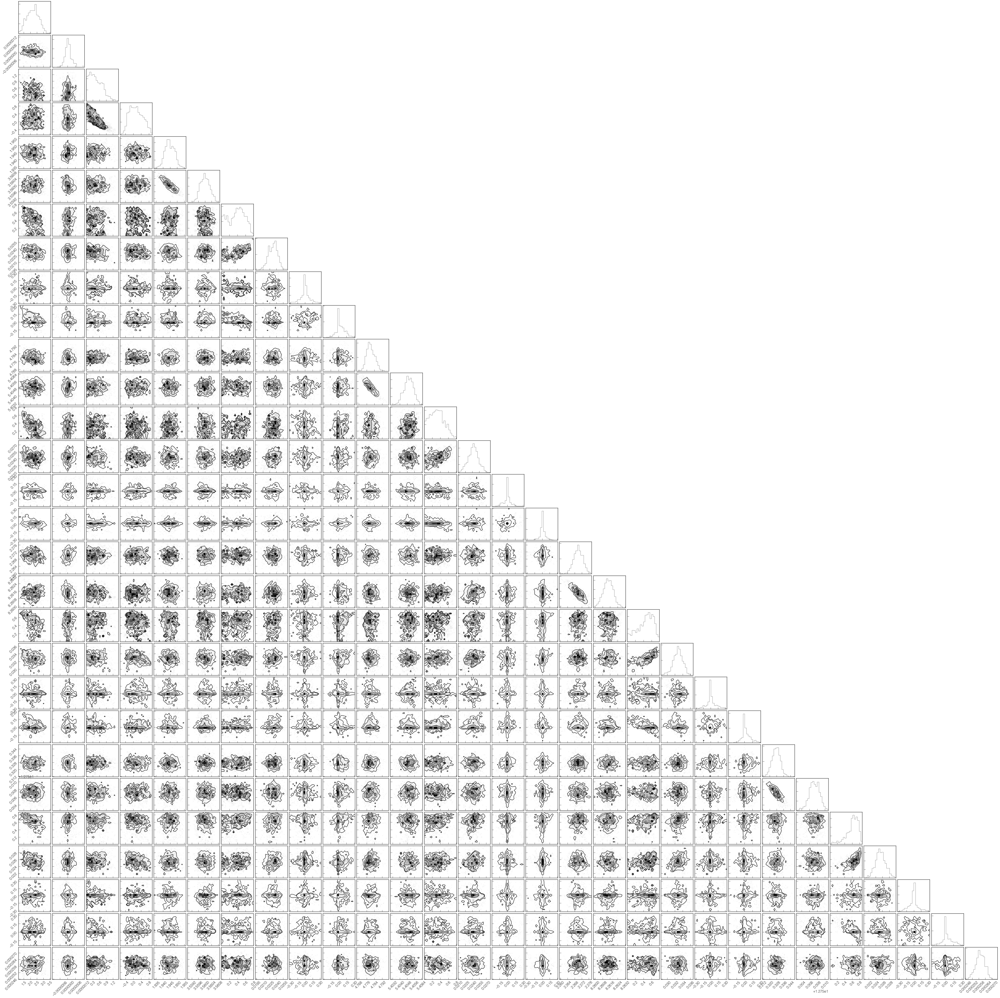

In [40]:
gg.shape
corner.corner(gg)

In [58]:
for i in range(29):
    v = np.percentile(g1[:,-550::100,i].flatten(),[15.9, 50, 84.1])
    print('${:.4f}^+{:.4f}_-{:.4f}$'.format(v[1], v[2]-v[1], v[1]-v[0]))

$2.1930^+0.4622_-0.4928$
$0.0000^+0.0000_-0.0000$
$0.3799^+0.3642_-0.2457$
$0.1199^+0.4041_-0.3365$
$1.9445^+0.0038_-0.0033$
$3.5600^+0.0003_-0.0003$
$0.3891^+0.2004_-0.2675$
$0.0233^+0.0009_-0.0011$
$0.0000^+0.0862_-0.0912$
$0.0176^+0.1121_-0.0417$
$4.7796^+0.0051_-0.0038$
$5.4050^+0.0005_-0.0006$
$0.3059^+0.1996_-0.1887$
$0.0243^+0.0010_-0.0012$
$-0.0000^+0.0472_-0.0707$
$0.0001^+0.0491_-0.0303$
$2.2700^+0.0027_-0.0026$
$8.2614^+0.0005_-0.0006$
$0.4779^+0.1597_-0.2535$
$0.0328^+0.0013_-0.0013$
$0.0000^+0.1086_-0.0790$
$0.0063^+0.1019_-0.0366$
$0.3273^+0.0048_-0.0048$
$12.7572^+0.0013_-0.0013$
$0.6309^+0.1175_-0.1806$
$0.0254^+0.0016_-0.0014$
$-0.0005^+0.0747_-0.1009$
$0.0125^+0.1197_-0.0407$
$0.0003^+0.0000_-0.0000$


In [59]:
for i in [4,10,16,22]:
    v = np.percentile(g1[:,-550::100,i].flatten() + 2457738.376807,[15.9, 50, 84.1])
    print('${:.4f}^+{:.4f}_-{:.4f}$'.format(v[1], v[2]-v[1], v[1]-v[0]))

$2457740.3213^+0.0038_-0.0033$
$2457743.1564^+0.0051_-0.0038$
$2457740.6468^+0.0027_-0.0026$
$2457738.7041^+0.0048_-0.0048$


In [9]:
l = len(g1[:,-550::100,0].flatten())
for i in [7,13,19,25]:
    p = g1[:,-550::100,i].flatten() * np.random.normal(0.82, 0.07, size=l) / 0.009155
    v = np.percentile(p,[15.9, 50, 84.1])
    print('${:.2f}^+{:.2f}_-{:.2f}$'.format(v[1], v[2]-v[1], v[1]-v[0]))

$2.07^+0.19_-0.21$
$2.16^+0.22_-0.21$
$2.94^+0.28_-0.27$
$2.26^+0.23_-0.23$


In [10]:
def get_ar(rho,period):
    """ gets a/R* from period and mean stellar density"""
    G = 6.67E-11
    rho_SI = rho * 1000.
    tpi = 3. * np.pi
    period_s = period * 86400.
    part1 = period_s**2 * G * rho_SI
    ar = (part1 / tpi)**(1./3.)
    return ar

In [11]:
for i in [5,11,17,23]:
    p = get_ar(g1[:,-550::100,0].flatten(),g1[:,-550::100,i].flatten()) * np.random.normal(0.82, 0.07, size=l) * 0.00464913034
    v = np.percentile(p,[15.9, 50, 84.1])
    print('${:.4f}^+{:.4f}_-{:.4f}$'.format(v[1], v[2]-v[1], v[1]-v[0]))

$0.0430^+0.0048_-0.0045$
$0.0569^+0.0064_-0.0064$
$0.0754^+0.0081_-0.0082$
$0.1001^+0.0119_-0.0110$


In [75]:
print(np.percentile(np.sqrt(g1[:,-550::100,8].flatten()**2+g1[:,-550::100,9].flatten()**2 ),[99.73]))
print(np.percentile(np.sqrt(g1[:,-550::100,14].flatten()**2+g1[:,-550::100,15].flatten()**2 ),[99.73]))
print(np.percentile(np.sqrt(g1[:,-550::100,20].flatten()**2+g1[:,-550::100,21].flatten()**2 ),[99.73]))
print(np.percentile(np.sqrt(g1[:,-550::100,26].flatten()**2+g1[:,-550::100,27].flatten()**2 ),[99.73]))


[ 0.33493477]
[ 0.32610955]
[ 0.33115751]
[ 0.33556836]


In [76]:
print(np.percentile(np.sqrt(g1[:,-550::100,8].flatten()**2+g1[:,-550::100,9].flatten()**2 ),[95.44997]))
print(np.percentile(np.sqrt(g1[:,-550::100,14].flatten()**2+g1[:,-550::100,15].flatten()**2 ),[95.44997]))
print(np.percentile(np.sqrt(g1[:,-550::100,20].flatten()**2+g1[:,-550::100,21].flatten()**2 ),[95.44997]))
print(np.percentile(np.sqrt(g1[:,-550::100,26].flatten()**2+g1[:,-550::100,27].flatten()**2 ),[95.44997]))
95.44997

[ 0.29017513]
[ 0.24639427]
[ 0.2941965]
[ 0.2957326]


95.44997

In [122]:
def get_qf(time,flux,epoch,period,transitmodel=None):
    date1 = (time - epoch) + 0.5*period
    phi1 = (((date1 / period) - np.floor(date1/period)) * period) - 0.5*period
    q1 = np.sort(phi1)
    f1 = (flux[np.argsort(phi1)]) * -1.E6
    if transitmodel is not None:
        m1 = (transitmodel[np.argsort(phi1)]) * -1.E6
        return q1,f1,m1
    else:
        return q1,f1

def plot_model(ax,time,flux, rho, zpt, ld1, ld2, T0, period, impact,rprs, cadence='long'):

    q1, f1 = get_qf(time,flux,T0,period)

    model = model_ktransit(time, rho, zpt, ld1, ld2, T0, period, impact,rprs, cadence=cadence)
    q1, m1 = get_qf(time,model,T0,period)
    ax.scatter(q1*24., f1/10000,color='k',alpha=period**0.5/5,s=4
              )
    ax.plot(q1*24., m1/10000,color='r')
    bq, bf, be = bin_data(q1,f1,bins=100.//period)
    ax.errorbar(bq*24., bf/10000, yerr=be/10000, ls='',color='b')
    ax.set_xlim([-4,4])
    ax.set_ylim([1.19,-0.75])
    #ax.set_xlabel('Time from mid-transit (days)')
    ax.set_ylabel('Transit depth (%)', fontsize=17)
    ax.minorticks_on()
    return ax

def bin_data(phi,flux,bins,model=None):
    phi = np.array(phi)
    flux = np.array(flux)
    phibin = []
    fluxbin = []
    stdbin = []
    bins=int(bins)
    for i in (bins*np.arange(len(phi)//bins))+(bins//2):
        if model == None:
            goodpoints = np.ones(len(flux),dtype=bool)
        else:
            goodpoints = flux-model < 3* np.std(flux-model)
        flux2 = flux[goodpoints]
        phi2 = phi[goodpoints]
        phibin.append(np.median(phi2[i-bins//2:i+bins//2]))
        fluxbin.append(np.median(flux2[i-bins//2:i+bins//2]))
        stdbin.append(np.std(flux2[i-bins//2:i+bins//2]))
    return np.array(phibin), np.array(fluxbin), np.array(stdbin) / np.sqrt(bins)

def model_ktransit(time, rho, zpt, ld1, ld2, T0, period, impact,rprs, cadence):
    M = LCModel()
    M.add_star(rho=rho,zpt=zpt,ld1=ld1,
            ld2=ld2,dil=0)
    M.add_planet(T0=T0,
                 period=period,
                 impact=impact,
                 rprs=rprs
                 )
    if cadence == 'long':
        M.add_data(time=time, itime=np.ones_like(time) * 0.0188)
    elif cadence == 'short':
        M.add_data(time=time, itime=np.ones_like(time) * 0.0188 / 30)
    return M.transitmodel

In [123]:
lnprob = f1['mcmc']['lnprob'][:]
mle_idx = np.unravel_index(lnprob.argmax(),
        lnprob.shape)
mle = g1[mle_idx]

In [124]:
mle

array([  2.39846468e+00,  -2.06957779e-08,   5.23309399e-01,
         2.55464417e-01,   1.94229707e+00,   3.56015446e+00,
         1.35548475e-01,   2.31118670e-02,   9.31835875e-02,
         1.20946835e-01,   4.78083601e+00,   5.40517606e+00,
         1.36613225e-01,   2.26308409e-02,  -2.71470821e-04,
        -9.01246545e-04,   2.26904401e+00,   8.26163937e+00,
         4.93740785e-01,   3.25837851e-02,  -9.09470724e-05,
        -1.14924920e-04,   3.27024733e-01,   1.27566372e+01,
         6.23486634e-01,   2.61667730e-02,  -1.09858557e-03,
        -4.60807594e-04,   2.59768338e-04])

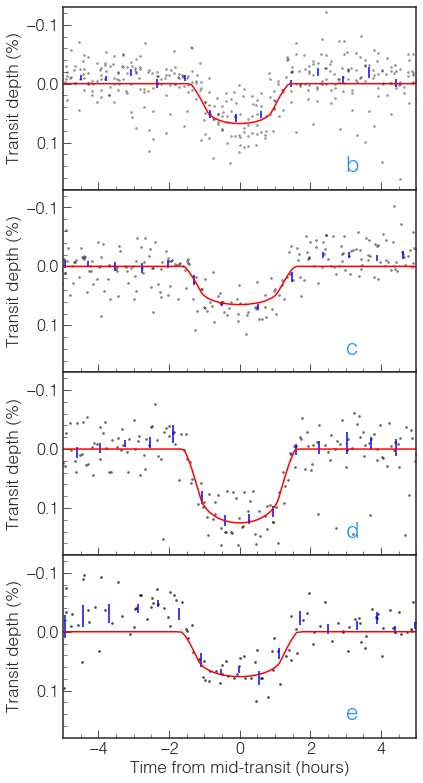

In [126]:
fig, axes = plt.subplots(4,1,figsize=[6,11], )

labels = ['b', 'c', 'd', 'e']
for i, p in enumerate(['pnum0', 'pnum1', 'pnum2', 'pnum3']):
    axes[i] = plot_model(
        axes[i], f1['time'][:], f1['flux'][:], 
        mle[0],
        mle[1],
        mle[2], 
        mle[3],
        mle[4+i*6],
        mle[5+i*6],
        mle[6+i*6],
        mle[7+i*6])
    
    axes[i].set_ylim(0.18,-0.13)
    axes[i].set_xlim(-5,5)
    axes[i].text(3.0,0.15, labels[i], fontsize=22, color='dodgerblue')
    axes[i].tick_params(labelbottom=False, )
    axes[i].tick_params(direction='in', which='both')
axes[-1].tick_params(labelbottom=True)
axes[-1].set_xlabel('Time from mid-transit (hours)', fontsize=17)
fig.subplots_adjust(hspace=0)
plt.tight_layout(h_pad=0)

fig.savefig('EE1-transitmodel.png')

In [39]:
d = np.genfromtxt('../data/245950175.csv', delimiter=',', skip_header=40, usecols=[0,3,4,5]).T

# dq = np.genfromtxt('../data/245950175.csv', delimiter=',', skip_header=40, usecols=[6,7,8,9], dtype='bool').T

(13, 19)

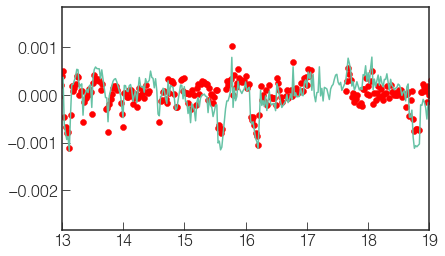

In [104]:
# plt.plot(d[0][~dq[1]], d[1][~dq[1]])
# plt.plot(d[0][~dq[3]], d[3][~dq[3]])
# plt.plot(d[0][~dq[2]], d[3][~dq[2]])
plt.plot(d[0][~dq[2]] - d[0][0], d[3][~dq[2]] / np.median(d[3][~dq[2]])-1.0)

plt.scatter(f1['time'][:] , f1['flux'][:], color='red')

plt.xlim(13,19)

In [103]:
np.savetxt('../data/lc-v2.txt', np.array([d[0][~dq[2]], d[3][~dq[2]]/ np.median(d[3][~dq[2]]).T)

In [105]:
d[0][~dq[2]]

array([ 2457738.376807,  2457738.397239,  2457738.417672, ...,
        2457815.956217,  2457815.976649,  2457815.997081])

In [110]:
d[0][~dq[2]], d[3][~dq[2]]/ np.median(d[3][~dq[2]])

(array([ 2457738.376807,  2457738.397239,  2457738.417672, ...,
         2457815.956217,  2457815.976649,  2457815.997081]),
 array([ 0.99957456,  0.99983702,  0.99967315, ...,  1.00117016,
         1.00043082,  1.00046841]))